<a href="https://colab.research.google.com/github/dmorepar/fudnut_MBIT/blob/main/FudNutIA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Proyecto PEIA MBIT

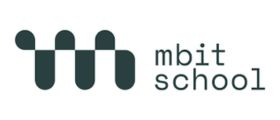

Realizado por Diego Moreno Parralejo

En el siguiente código se muestra el desarrollo del modelo para la clasificación de alimentos

##1. Descargar desde Kaggle

Se descarga el dataset por medio de la API de Kaggle

In [ ]:
!pip install -q kaggle
!pip install split-folders

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"diegomorenoparralejo","key":"de1e623997759022eaeb8089c71ea648"}'}

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                         title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
sudarshan24byte/online-food-dataset                         Online Food Dataset                              3KB  2024-03-02 18:50:30          18963        381  0.9411765        
sahirmaharajj/electric-vehicle-population-size-2024         Electric Vehicle Population by Country (2024)  275KB  2024-03-30 19:16:06           1005         30  1.0              
mexwell/drug-consumption-classification                     💊 Drug Consumption Classification               56KB  2024-03-28 15:02:22           1532         33  1.0              
bhavikjikadara/student-study-performance                    Student Study Performance                    

In [ ]:
!kaggle datasets download -d kmader/food41

100% 5.30G/5.30G [00:46<00:00, 179MB/s]
100% 5.30G/5.30G [00:46<00:00, 122MB/s]


In [ ]:
!unzip food41.zip -d food

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: food/images/tacos/1026681.jpg  
  inflating: food/images/tacos/1030289.jpg  
  inflating: food/images/tacos/1033196.jpg  
  inflating: food/images/tacos/1036030.jpg  
  inflating: food/images/tacos/1042175.jpg  
  inflating: food/images/tacos/1044043.jpg  
  inflating: food/images/tacos/1058697.jpg  
  inflating: food/images/tacos/1059239.jpg  
  inflating: food/images/tacos/1059326.jpg  
  inflating: food/images/tacos/1066762.jpg  
  inflating: food/images/tacos/1070967.jpg  
  inflating: food/images/tacos/1073468.jpg  
  inflating: food/images/tacos/1075296.jpg  
  inflating: food/images/tacos/1085243.jpg  
  inflating: food/images/tacos/108529.jpg  
  inflating: food/images/tacos/1086014.jpg  
  inflating: food/images/tacos/108945.jpg  
  inflating: food/images/tacos/1089575.jpg  
  inflating: food/images/tacos/1091159.jpg  
  inflating: food/images/tacos/1101369.jpg  
  inflating: food/images/tacos/1109058.jp

##2. Librerías

In [ ]:
from tensorflow.keras.utils import load_img, img_to_array
from keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from glob import glob
import os
import tensorflow as tf
import matplotlib.image as img
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import splitfolders
import random

##3. Visualización datos

In [ ]:
print(os.listdir("/content/food/images"))

['gyoza', 'beef_tartare', 'carrot_cake', 'pho', 'sushi', 'fried_calamari', 'baklava', 'club_sandwich', 'ravioli', 'sashimi', 'hamburger', 'fish_and_chips', 'garlic_bread', 'pork_chop', 'shrimp_and_grits', 'hot_and_sour_soup', 'chocolate_mousse', 'cannoli', 'greek_salad', 'beef_carpaccio', 'ramen', 'cup_cakes', 'grilled_cheese_sandwich', 'chocolate_cake', 'paella', 'risotto', 'panna_cotta', 'omelette', 'steak', 'hummus', 'ice_cream', 'onion_rings', 'spring_rolls', 'pizza', 'foie_gras', 'pancakes', 'waffles', 'filet_mignon', 'cheesecake', 'macarons', 'tacos', 'spaghetti_bolognese', 'prime_rib', 'bread_pudding', 'lasagna', 'frozen_yogurt', 'apple_pie', 'caprese_salad', 'fried_rice', 'lobster_roll_sandwich', 'beignets', 'french_fries', 'beet_salad', 'chicken_quesadilla', 'chicken_wings', 'breakfast_burrito', 'spaghetti_carbonara', 'churros', 'french_onion_soup', 'caesar_salad', 'tiramisu', 'cheese_plate', 'seaweed_salad', 'hot_dog', 'macaroni_and_cheese', 'gnocchi', 'edamame', 'grilled_sal

In [ ]:
values = ['gnocchi', 'red_velvet_cake', 'frozen_yogurt', 'fried_rice', 'pizza', 'oysters', 'seaweed_salad', 'donuts', 'steak', 'crab_cakes', 'ramen', 'deviled_eggs', 'fried_calamari', 'tiramisu', 'ceviche', 'macarons', 'pulled_pork_sandwich', 'huevos_rancheros', 'onion_rings', 'foie_gras', 'french_fries', 'sashimi', 'tacos', 'beef_tartare', 'breakfast_burrito', 'edamame', 'guacamole', 'grilled_salmon', 'chicken_quesadilla', 'poutine', 'french_onion_soup', 'lobster_roll_sandwich', 'greek_salad', 'ice_cream', 'shrimp_and_grits', 'carrot_cake', 'nachos', 'spring_rolls', 'gyoza', 'caprese_salad', 'miso_soup', 'cup_cakes', 'beignets', 'sushi', 'croque_madame', 'dumplings', 'club_sandwich', 'pho', 'risotto', 'hot_and_sour_soup', 'spaghetti_carbonara', 'strawberry_shortcake', 'scallops', 'caesar_salad', 'grilled_cheese_sandwich', 'beet_salad', 'pork_chop', 'ravioli', 'samosa', 'hamburger', 'french_toast', 'paella', 'creme_brulee', 'lasagna', 'baby_back_ribs', 'chocolate_mousse', 'chocolate_cake', 'apple_pie', 'omelette', 'cannoli', 'baklava', 'filet_mignon', 'fish_and_chips', 'waffles', 'macaroni_and_cheese', 'spaghetti_bolognese', 'prime_rib', 'falafel', 'tuna_tartare', 'churros', 'bibimbap', 'panna_cotta', 'clam_chowder', 'takoyaki', 'pancakes', 'eggs_benedict', 'hot_dog', 'cheese_plate', 'garlic_bread', 'cheesecake', 'peking_duck', 'hummus', 'bruschetta', 'lobster_bisque', 'mussels', 'bread_pudding', 'escargots', 'pad_thai', 'beef_carpaccio', 'chicken_wings', 'chicken_curry']
values.sort()
print(values)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

In [ ]:
print("Number of classes:",len(values))

Number of classes: 101


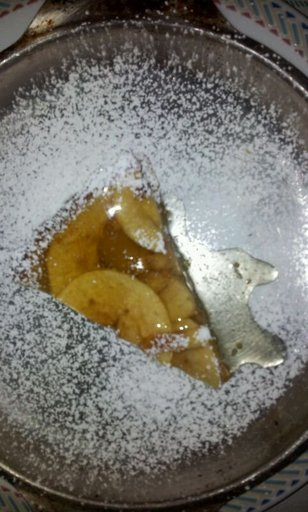

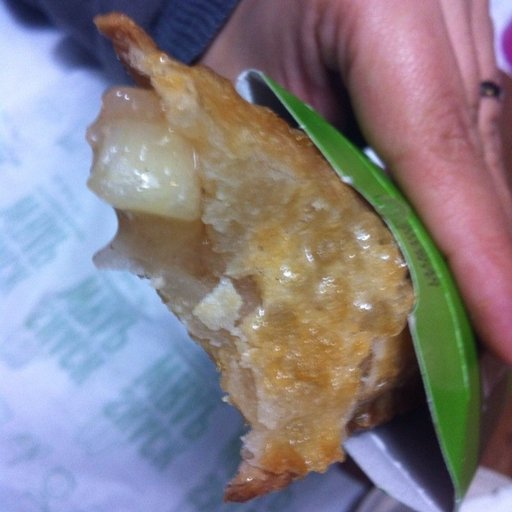

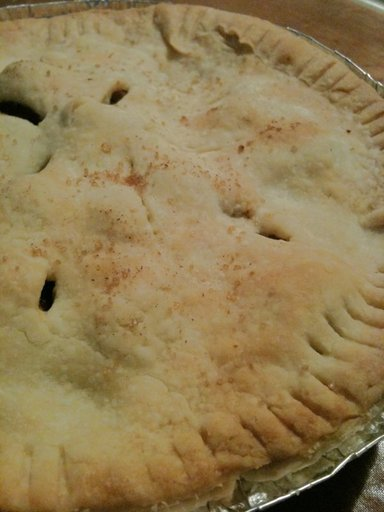

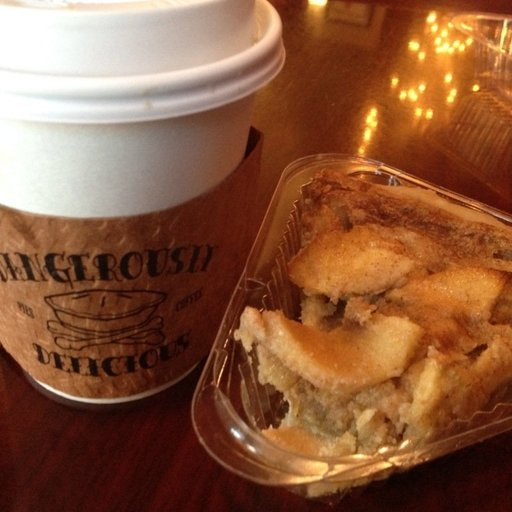

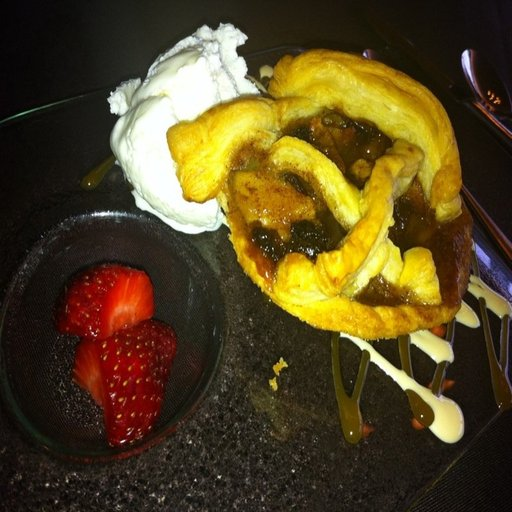

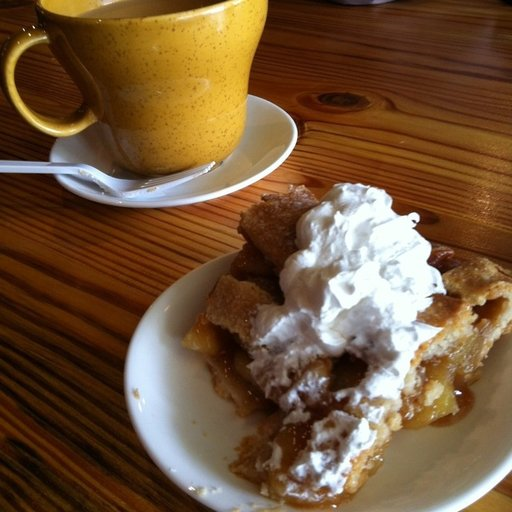

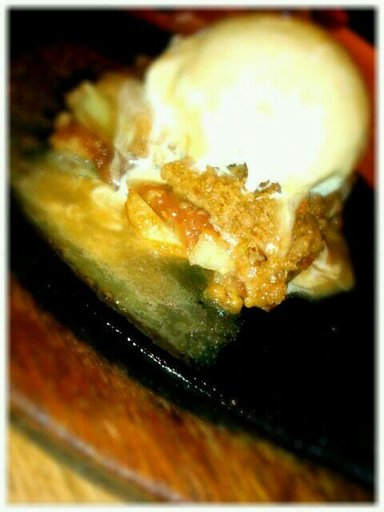

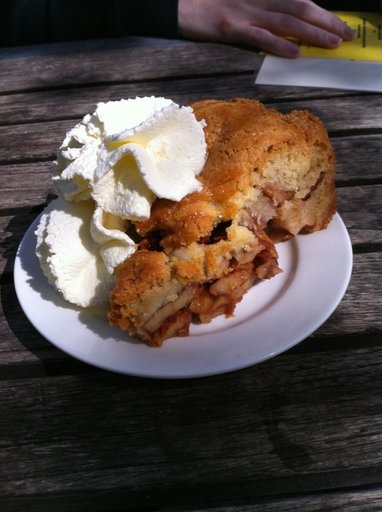

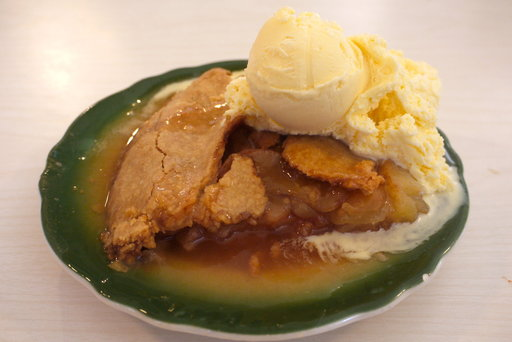

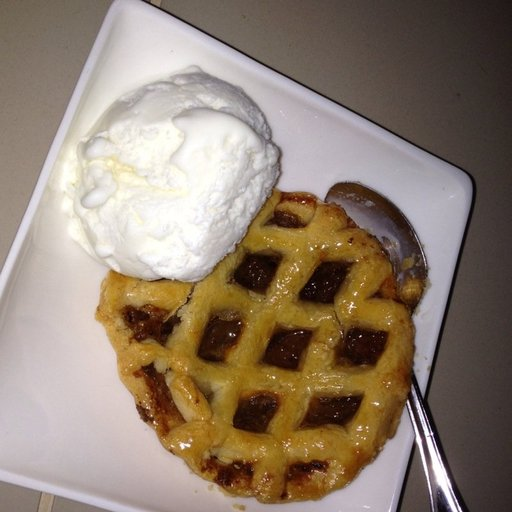

In [ ]:
foods = sorted(glob("/content/food/images/apple_pie/*"))
for food in foods[:10]:
  imagen = load_img(food)
  display(imagen)
  print()

##4. Preparación datos train/test

Se separa el conjunto de datos con la proporción del 70% para entrenamiento, 20% para validacion y 10% para test

In [ ]:
path = "/content/food/images/"
splitfolders.ratio(path,seed=1337, output="/content/dataset_split/", ratio=(0.70, 0.2, 0.1))

Copying files: 101000 files [01:45, 958.90 files/s] 


In [ ]:
print("Total number of samples in train folder")

!find /content/dataset_split/train -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
70700


In [ ]:
print("Total number of samples in val folder")

!find /content/dataset_split/val -type d -or -type f -printf '.' | wc -c

Total number of samples in val folder
20200


In [ ]:
print("Total number of samples in test folder")

!find /content/dataset_split/test -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
10100


##5. Mini datasets

Debido a problemas computacionales, se decide utilizar 11 clases que se detallan en food_list.

In [ ]:
def dataset_mini(food_list, src, dest):
    if os.path.exists(dest):
        rmtree(dest)
    os.makedirs(dest)

    for food_item in food_list:
        print("Copying images into", food_item)
        copytree(os.path.join(src, food_item), os.path.join(dest, food_item))

In [ ]:
# List of food items for creating mini datasets
num_classes = 11

food_list = ["french_fries", "fried_rice", "frozen_yogurt", "garlic_bread", "greek_salad", "guacamole", "hamburger", "hummus", "ice_cream", "pizza", "steak"]


# Source and destination directories for train and test datasets
src_train = '/content/dataset_split/train'
dest_train = '/content/minidataset_prepared/train_mini'
src_val = '/content/dataset_split/val'
dest_val = '/content/minidataset_prepared/val_mini'
src_test = '/content/dataset_split/test'
dest_test = '/content/minidataset_prepared/test_mini'

# Create train_mini dataset
dataset_mini(food_list, src_train, dest_train)

dataset_mini(food_list, src_val, dest_val)

# Create test_mini dataset
dataset_mini(food_list, src_test, dest_test)

Copying images into french_fries
Copying images into fried_rice
Copying images into frozen_yogurt
Copying images into garlic_bread
Copying images into greek_salad
Copying images into guacamole
Copying images into hamburger
Copying images into hummus
Copying images into ice_cream
Copying images into pizza
Copying images into steak
Copying images into french_fries
Copying images into fried_rice
Copying images into frozen_yogurt
Copying images into garlic_bread
Copying images into greek_salad
Copying images into guacamole
Copying images into hamburger
Copying images into hummus
Copying images into ice_cream
Copying images into pizza
Copying images into steak
Copying images into french_fries
Copying images into fried_rice
Copying images into frozen_yogurt
Copying images into garlic_bread
Copying images into greek_salad
Copying images into guacamole
Copying images into hamburger
Copying images into hummus
Copying images into ice_cream
Copying images into pizza
Copying images into steak


In [ ]:
print("Total number of samples in train folder")

!find /content/minidataset_prepared/train_mini -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
7700


In [ ]:
print("Total number of samples in val folder")

!find /content/minidataset_prepared/val_mini -type d -or -type f -printf '.' | wc -c

Total number of samples in val folder
2200


In [ ]:
print("Total number of samples in test folder")

!find /content/minidataset_prepared/test_mini -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
1100


##6. Normalización de datos

Se generan los datasets normalizados. Destacar el uso de Data Augmentation en entrenamiento.

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

batch_size= 32

train_data = train_datagen.flow_from_directory('/content/minidataset_prepared/train_mini/',
                                               target_size=(224,224),
                                               batch_size=batch_size,
                                               class_mode='categorical',
                                               shuffle=True)

test_datagen = ImageDataGenerator(rescale=1./255)

val_data = test_datagen.flow_from_directory('/content/minidataset_prepared/val_mini/',
                                               target_size=(224,224),
                                               batch_size=batch_size,
                                               class_mode='categorical',
                                               shuffle=True)


test_data = test_datagen.flow_from_directory('/content/minidataset_prepared/test_mini',
                                               target_size=(224,224),
                                               batch_size=batch_size,
                                               class_mode='categorical',
                                               shuffle=False)

Found 7700 images belonging to 11 classes.
Found 2200 images belonging to 11 classes.
Found 1100 images belonging to 11 classes.


In [ ]:
print(train_data.image_shape)

(224, 224, 3)


##7. Entrenamiento

###Inception

Utilización de la red InceptionV3 y 4 capas adicionales para adaptar el aprendizaje por trasnferencia.

In [ ]:
from tensorflow.keras.applications import InceptionV3
inc_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

for layer in inc_model.layers:
    layer.trainable = False
inc_model.summary()

87910968/87910968 [==============================] - 1s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activatio

In [ ]:
model = tf.keras.Sequential()
model.add(inc_model)
model.add(tf.keras.layers.AveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(num_classes, kernel_regularizer=tf.keras.regularizers.l2(0.0005), activation="softmax"))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 average_pooling2d_9 (Avera  (None, 2, 2, 2048)        0         
 gePooling2D)                                                    
                                                                 
 dropout (Dropout)           (None, 2, 2, 2048)        0         
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 11)                90123     
                                                                 
Total params: 21892907 (83.51 MB)
Trainable params: 90123 (352.04 KB)
Non-trainable params: 21802784 (83.17 MB)
__________

In [ ]:
from tensorflow.keras.optimizers import Adam

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=0.1), metrics=["accuracy"])

##8. Gráficas

In [ ]:
number_train_samples = train_data.n
number_val_samples   = val_data.n
number_test_samples  = test_data.n

number_train_samples, number_val_samples, number_test_samples

(7700, 2200, 1100)

In [ ]:
from matplotlib.ticker import MaxNLocator
from IPython.display import clear_output

def grafica_entrenamiento(tr_acc, val_acc, tr_loss, val_loss,
                          figsize=(10,4)):
    best_i = np.argmin(val_loss)
    plt.figure(figsize=figsize)
    ax = plt.subplot(1,2,1)
    plt.plot(1+np.arange(len(tr_acc)),  100*np.array(tr_acc))
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc))
    plt.plot(1+best_i, 100*val_acc[best_i], 'or')
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.subplot(1,2,2)
    plt.plot(1+np.arange(len(tr_acc)), np.array(tr_loss))
    plt.plot(1+np.arange(len(val_acc)), np.array(val_loss))
    plt.plot(1+best_i, val_loss[best_i], 'or')
    plt.title('loss del modelo', fontsize=18)
    plt.ylabel('loss', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

In [ ]:
from keras.callbacks import ModelCheckpoint

modelpath="model_fudnut.h5"

epochs = 25

checkpoint = ModelCheckpoint(modelpath, monitor='val_loss', verbose=1,
                             save_best_only=True,
                             mode='min')

serie_tr_acc = []
serie_val_acc = []
serie_tr_loss  = []
serie_val_loss = []

Se define la estrategia de disminuir el LR a medida que las épocas aumentan.

In [ ]:
def schedule(epoch):
    if epoch < 5:
        return 0.001
    elif epoch < 10:
        return .0002
    elif epoch < 15:
        return 0.00002
    else:
        return .0000005
lr_scheduler = LearningRateScheduler(schedule)

In [ ]:
salida = model.fit(train_data,
                       steps_per_epoch=number_train_samples // batch_size,
                       epochs=25,
                       callbacks=[checkpoint, lr_scheduler],
                       verbose=1,
                       shuffle = True,
                       validation_data=val_data,
                       validation_steps=number_val_samples // batch_size
                      )
serie_tr_acc.append(salida.history["accuracy"][0])
serie_val_acc.append(salida.history["val_accuracy"][0])
serie_tr_loss.append(salida.history["loss"][0])
serie_val_loss.append(salida.history["val_loss"][0])

Epoch 1/25
240/240 [==============================] - ETA: 0s - loss: 1.7549 - accuracy: 0.6092
Epoch 1: val_loss improved from inf to 0.93655, saving model to /content/drive/MyDrive/EXPERTO IA/TRABAJO/Experimentos/best_model_inc_pizza.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


240/240 [==============================] - 137s 538ms/step - loss: 1.7549 - accuracy: 0.6092 - val_loss: 0.9366 - val_accuracy: 0.7610 - lr: 0.0010
Epoch 2/25
240/240 [==============================] - ETA: 0s - loss: 1.4231 - accuracy: 0.6911
Epoch 2: val_loss did not improve from 0.93655
240/240 [==============================] - 126s 524ms/step - loss: 1.4231 - accuracy: 0.6911 - val_loss: 1.0607 - val_accuracy: 0.7762 - lr: 0.0010
Epoch 3/25
240/240 [==============================] - ETA: 0s - loss: 1.4642 - accuracy: 0.7017
Epoch 3: val_loss did not improve from 0.93655
240/240 [==============================] - 125s 521ms/step - loss: 1.4642 - accuracy: 0.7017 - val_loss: 1.0475 - val_accuracy: 0.7799 - lr: 0.0010
Epoch 4/25
240/240 [==============================] - ETA: 0s - loss: 1.5428 - accuracy: 0.7115
Epoch 4: val_loss did not improve from 0.93655
240/240 [==============================] - 128s 534ms/step - loss: 1.5428 - accuracy: 0.7115 - val_loss: 1.0343 - val_accuracy:

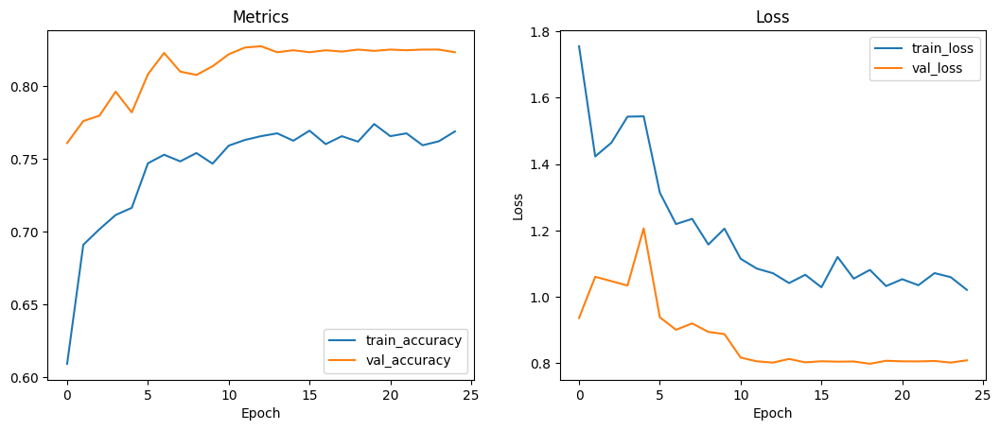

In [ ]:
default_size = plt.rcParams['figure.figsize']
fig = plt.figure(figsize=[default_size[0] * 2, default_size[1]])

fig.add_subplot(1, 2, 1)

# Plot train accuracy
plt.plot(salida.history['accuracy'], label='train_accuracy')
plt.plot(salida.history['val_accuracy'], label='val_accuracy')

plt.xlabel('Epoch')
plt.title('Metrics')
plt.legend()

fig.add_subplot(1, 2, 2)

# Plot train loss
plt.plot(salida.history['loss'], label='train_loss')
plt.plot(salida.history['val_loss'], label='val_loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()


##Análisis

In [ ]:
from keras.models import load_model

modelpath="model_fudnut.h5"

model = load_model(modelpath)

In [ ]:
scores_tr = model.evaluate(train_data)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(val_data)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_data)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

241/241 [==============================] - 116s 473ms/step - loss: 0.6769 - accuracy: 0.8286
Train loss    : 0.676917314529419
Train accuracy: 0.8285714387893677

69/69 [==============================] - 10s 137ms/step - loss: 0.8039 - accuracy: 0.8241
Val loss    : 0.8038740754127502
Val accuracy: 0.8240908980369568

35/35 [==============================] - 6s 157ms/step - loss: 0.7228 - accuracy: 0.8436
Test loss     : 0.7228225469589233
Test accuracy : 0.8436363339424133


In [ ]:
from sklearn.metrics import classification_report, roc_curve, auc

y_real = np.array(test_data.classes)
y_pred_proba = model.predict(test_data)
y_pred = np.argmax(y_pred_proba, axis=1)
print('')
print(classification_report(y_real, y_pred))

35/35 [==============================] - 5s 111ms/step

              precision    recall  f1-score   support

           0       0.93      0.92      0.92       100
           1       0.85      0.81      0.83       100
           2       0.82      0.85      0.83       100
           3       0.87      0.88      0.88       100
           4       0.84      0.81      0.83       100
           5       0.90      0.88      0.89       100
           6       0.88      0.90      0.89       100
           7       0.82      0.71      0.76       100
           8       0.73      0.77      0.75       100
           9       0.88      0.89      0.89       100
          10       0.77      0.86      0.82       100

    accuracy                           0.84      1100
   macro avg       0.84      0.84      0.84      1100
weighted avg       0.84      0.84      0.84      1100



##Visualización de ejemplos de test

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_data = test_datagen.flow_from_directory('/content/minidataset_prepared/test_mini',
                                               target_size=(224,224),
                                               batch_size=batch_size,
                                               class_mode='categorical',
                                               shuffle=False)

Found 1100 images belonging to 11 classes.


In [ ]:
from tensorflow.keras.preprocessing import image

def predict_class(model, images, show=True):
    for img in images:
        img = image.load_img(img, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img /= 255.

        pred = model.predict(img)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]

        if show:
            plt.imshow(img[0])
            plt.axis('off')
            plt.title(pred_value)
            plt.show()

1/1 [==============================] - 0s 28ms/step


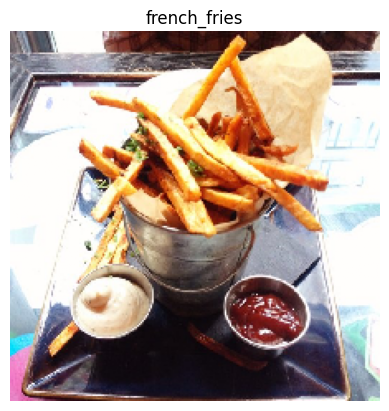

1/1 [==============================] - 0s 38ms/step


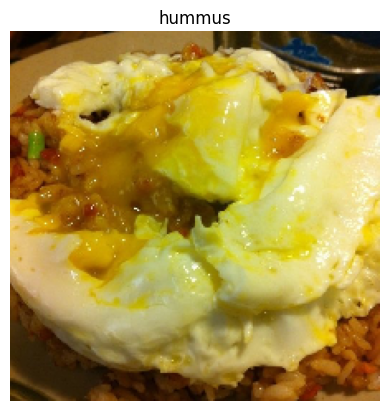

1/1 [==============================] - 0s 26ms/step


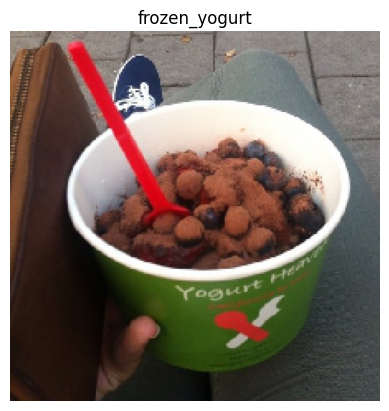

1/1 [==============================] - 0s 26ms/step


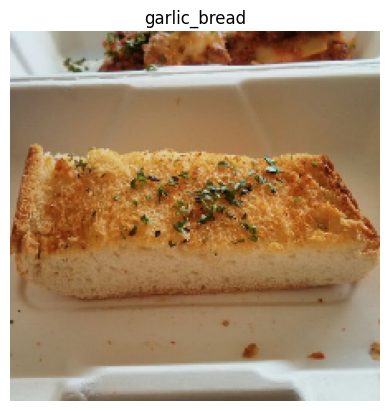

1/1 [==============================] - 0s 29ms/step


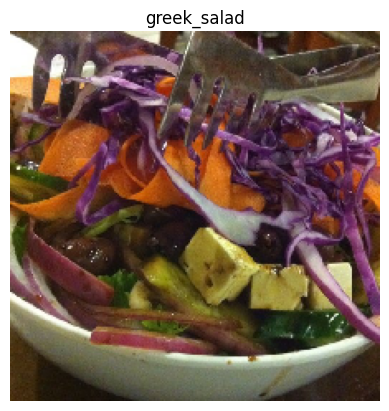

1/1 [==============================] - 0s 26ms/step


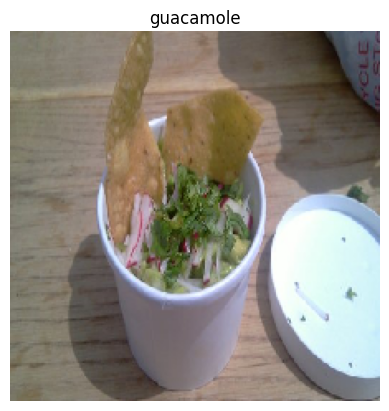

1/1 [==============================] - 0s 29ms/step


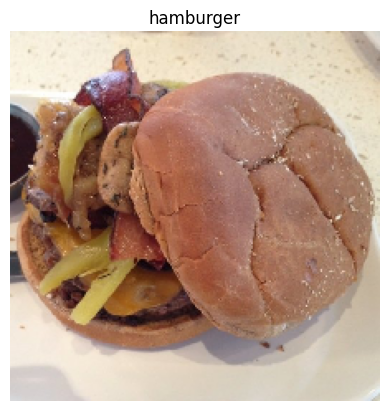

1/1 [==============================] - 0s 41ms/step


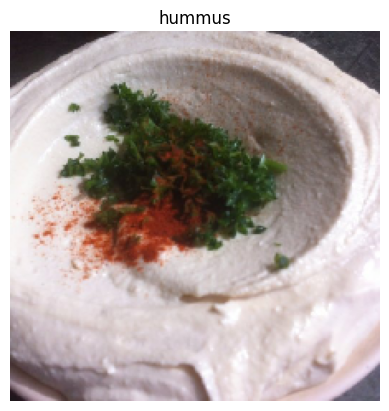

1/1 [==============================] - 0s 53ms/step


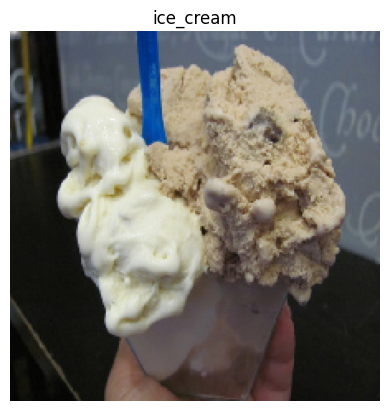

1/1 [==============================] - 0s 40ms/step


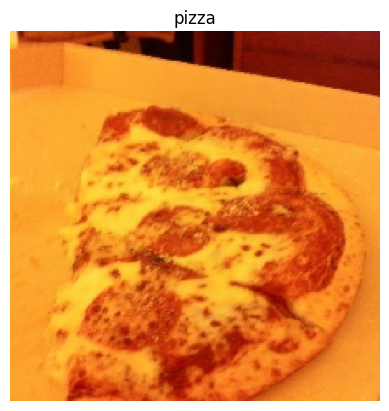

1/1 [==============================] - 0s 38ms/step


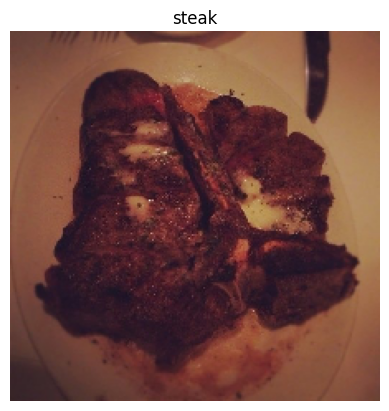

In [ ]:
ruta_test = "/content/minidataset_prepared/test_mini/"

comida = random.choice(food_list)

rutas_images = []
for comida in food_list:

  path_food = os.path.join(ruta_test, comida)

  images_list = os.listdir(path_food)

  images = random.choice(images_list)

  path_images = os.path.join(path_food, images)

  rutas_images.append(path_images)

predict_class(model, rutas_images, True)

##Prototipado

In [ ]:
meal = {
    "french_fries" : [312, 49, 12, 3, 1],
    "fried_rice" : [130, 28, 2.7, 0, 0.1],
    "frozen_yogurt" : [61, 3.5, 4.7, 3.3, 4.7],
    "garlic_bread" : [265, 8, 50, 2, 3],
    "greek_salad" : [75, 7, 3.5, 4, 1],
    "guacamole" : [170, 10, 2.5, 15, 1],
    "hamburger" : [350, 22, 25, 18, 2],
    "hummus" : [166, 14, 8, 10, 0.5],
    "ice_cream" : [250, 25, 3, 11, 20],
    "pizza" : [150, 25, 33, 10, 1],
    "steak" : [170, 7, 22, 5, 0]
}

In [ ]:
from tensorflow.keras.preprocessing import image

def predict_class(model, images, show=True):
    for img in images:
        img = image.load_img(img, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img /= 255.

        pred = model.predict(img)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]

        if show:
            plt.imshow(img[0])
            plt.axis('off')
            plt.title(pred_value)

            food = meal[pred_value]
            print("Calorías: ", food[0])
            print("Carbohidratos: ", food[1])
            print("Porteínas: ", food[2])
            print("Grasas: ", food[3])
            print("Azúcares: ", food[4])

            plt.show()

1/1 [==============================] - 0s 47ms/step
Calorías:  312
Carbohidratos:  49
Porteínas:  12
Grasas:  3
Azúcares:  1


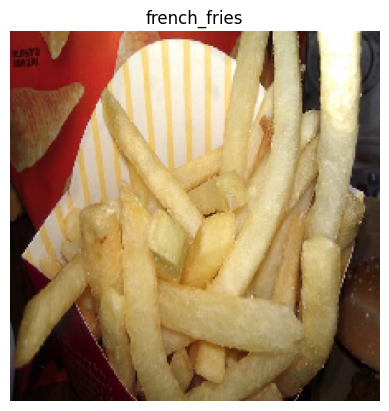

1/1 [==============================] - 0s 25ms/step
Calorías:  130
Carbohidratos:  28
Porteínas:  2.7
Grasas:  0
Azúcares:  0.1


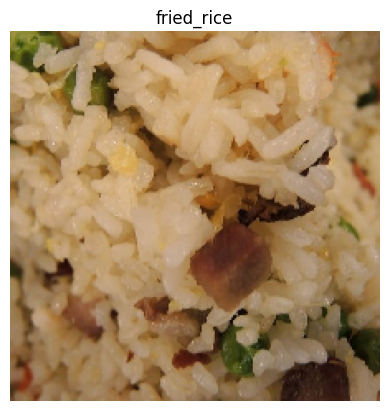

1/1 [==============================] - 0s 73ms/step
Calorías:  61
Carbohidratos:  3.5
Porteínas:  4.7
Grasas:  3.3
Azúcares:  4.7


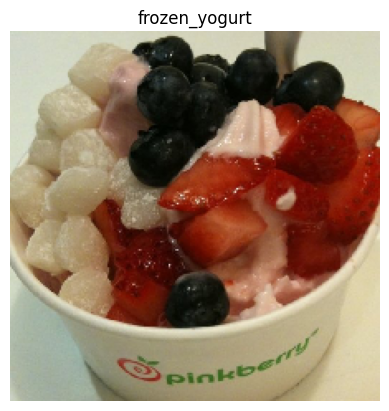

1/1 [==============================] - 0s 99ms/step
Calorías:  265
Carbohidratos:  8
Porteínas:  50
Grasas:  2
Azúcares:  3


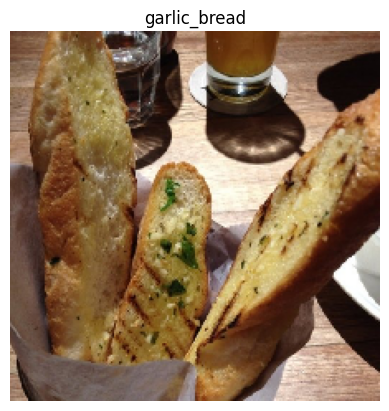

1/1 [==============================] - 0s 42ms/step
Calorías:  170
Carbohidratos:  10
Porteínas:  2.5
Grasas:  15
Azúcares:  1


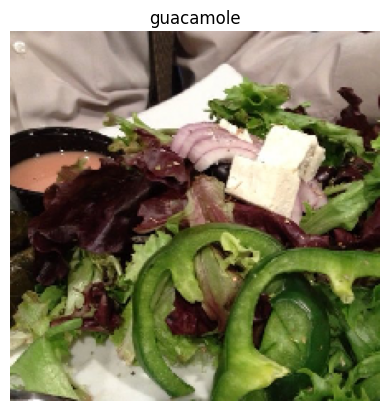

1/1 [==============================] - 0s 41ms/step
Calorías:  170
Carbohidratos:  10
Porteínas:  2.5
Grasas:  15
Azúcares:  1


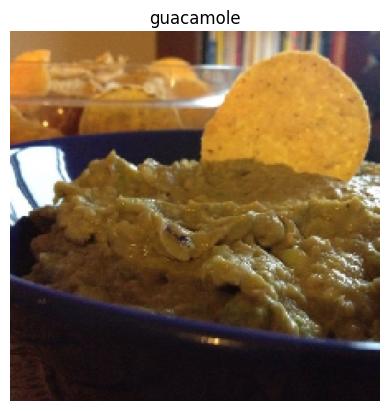

1/1 [==============================] - 0s 86ms/step
Calorías:  350
Carbohidratos:  22
Porteínas:  25
Grasas:  18
Azúcares:  2


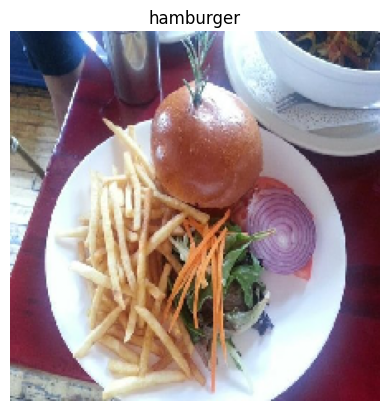

1/1 [==============================] - 0s 47ms/step
Calorías:  166
Carbohidratos:  14
Porteínas:  8
Grasas:  10
Azúcares:  0.5


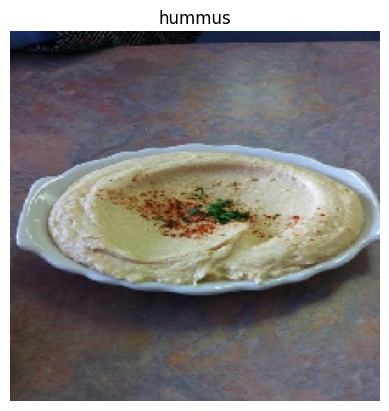

1/1 [==============================] - 0s 43ms/step
Calorías:  250
Carbohidratos:  25
Porteínas:  3
Grasas:  11
Azúcares:  20


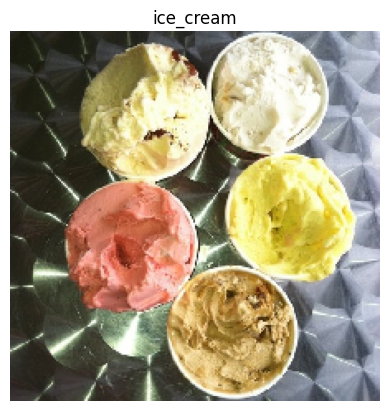

1/1 [==============================] - 0s 44ms/step
Calorías:  150
Carbohidratos:  25
Porteínas:  33
Grasas:  10
Azúcares:  1


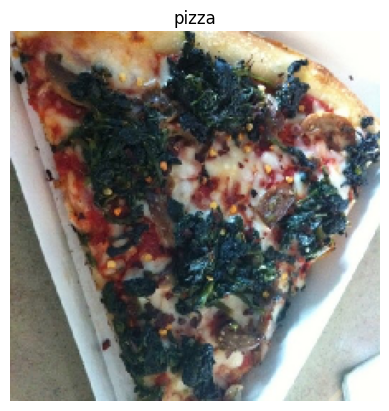

1/1 [==============================] - 0s 44ms/step
Calorías:  170
Carbohidratos:  7
Porteínas:  22
Grasas:  5
Azúcares:  0


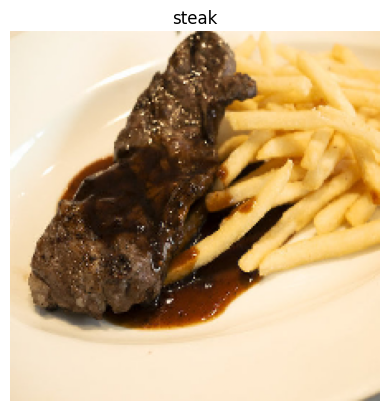

In [ ]:
ruta_test = "/content/minidataset_prepared/test_mini/"

comida = random.choice(food_list)

rutas_images = []
for comida in food_list:

  path_food = os.path.join(ruta_test, comida)

  images_list = os.listdir(path_food)

  images = random.choice(images_list)

  path_images = os.path.join(path_food, images)

  rutas_images.append(path_images)

predict_class(model, rutas_images, True)